<a href="https://colab.research.google.com/github/ua-datalab/NLP-Speech/blob/main/Speech_to_Text_with_Whisper/Speech_to_Text_with_Whisper.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<center><h1>Speech-to-Text with Whisper AI</h1></center>

![](https://images.ctfassets.net/kftzwdyauwt9/18ff9c06-7853-4e3b-d849bc901978/2b49cdd19fcdf22f689f606fdf2dc8d6/asr-details-desktop.svg?w=1920&q=90)

## Housekeeping
1. Check that the recording is on
2. Check audio and screenshare
3. Share link to notebook in chat
4. Light mode and readable font size
5. GPU runtime and `run-all`

# Some terminology
- Speech-To-Text (STT): A task for taking an audio file with speech as input, and returning the words and sentences sporken as the output, usually with timestamps.
- Transcripts: A file with all the audio saved in a text format.
- (Close) Captions: Text that follows the audio, and may include descriptions of the audio and video content.
- Subtitles: translations of captions into another language.
- Word Error Rate (WER): A metric used to evaluate transcription quality. It is the percentage of words incorrectly transcribed in utterances in a transcript, per 100 words in the transcript.


# Transcription formats and content
- `.vtt, .srt`
- Textfiles, Json, textgrids
- Speaker, content, timestamps

1. VTT (WebVTT)
WebVTT is commonly used for displaying timed text tracks in HTML5 videos.

```
WEBVTT

00:00:00.000 --> 00:00:02.500
Hello, and welcome to today's workshop

00:00:02.500 --> 00:00:05.000
where we will discuss speech recognition.
```

2. SRT (SubRip Subtitle)
SRT is one of the most widely used subtitle formats, known for its simplicity.

```
SRT
1
00:00:00,000 --> 00:00:02,500
Hello, and welcome to today's workshop

2
00:00:02,500 --> 00:00:05,000
where we will discuss speech recognition.
```

3. JSON can be useful for storing structured data, including transcription with timestamps.

```
{
    "transcriptions": [
        {
            "start": "00:00:00.000",
            "end": "00:00:02.500",
            "text": "Hello, and welcome to our video."
        },
        {
            "start": "00:00:02.500",
            "end": "00:00:05.000",
            "text": "Today, we will discuss the basics of speech recognition."
        }
    ]
}
```
4. Textgrids- these are outputs from speech processing software like Praat, where the same file contains data from multiple annotation tiers. Itsa great way to annotate audio more than one way.

```
FileType = "ooTextFile"
ObjectClass = "TextGrid"
xmin = 0
xmax = 10
tiers? <exists>
size = 2
item []:
    item [0]:
        class = "IntervalTier"
        name = "Words"
        xmin = 0
        xmax = 10
        intervals: size = 3
        intervals [0]: xmin = 0.0; xmax = 2.5; text = "Hello"
        intervals [1]: xmin = 2.5; xmax = 5.0; text = "and welcome"
        intervals [2]: xmin = 5.0; xmax = 10.0; text = "to today's session"
    item [1]:
        class = "IntervalTier"
        name = "Phonemes"
        xmin = 0
        xmax = 10
        intervals: size = 6
        intervals [0]: xmin = 0.0; xmax = 0.5; text = "H"
        intervals [1]: xmin = 0.5; xmax = 1.0; text = "ɛ"
        intervals [2]: xmin = 1.0; xmax = 1.5; text = "l"
        intervals [3]: xmin = 1.5; xmax = 2.0; text = "o"
        intervals [4]: xmin = 2.5; xmax = 3.0; text = "a"
        intervals [5]: xmin = 3.0; xmax = 3.5; text = "n"
```

**Bottom line:** all transcrition outputs contain information about the content of a recording, and can be inter-converted. For our NLP pipeline, it is important to know which one is being asked for.

# Popular use cases
- Accessibility
- Audio input for assistants, hands-free applications
- Downstream NLP tasks


# Available Transcription services
- Free:
  - Coqui
  - SpeechBrain
- Paid
  - Zoom (free for U of A affiliates)
  - AWS
  - Google ASR

# Zoom Transcription and Captions

- Free for premium accounts
- Setup on the Zoom Cloud
- Great for non-private settings
- Generates `.vtt` files with timestamps, as well as transcript file `.txt`. Ignores false starts and filler sounds
- Caption support for many languages

## Documentation:
- [Enabling or disabling audio transcription for cloud recordings](https://support.zoom.com/hc/en/article?id=zm_kb&sysparm_article=KB0065911)
- [Enabling automated captions](https://support.zoom.com/hc/en/article?id=zm_kb&sysparm_article=KB0058810)
- [Enabling and configuring translated captions](https://support.zoom.com/hc/en/article?id=zm_kb&sysparm_article=KB0059081)
- [Real-time automatic caption translation](https://support.zoom.com/hc/en/article?id=zm_kb&sysparm_article=KB0060844)

# Downstream NLP tasks from STT data

- Conversation summarization and automatic note-taking
- Topic analysis
- NER
- Speaker dominance and conversation quality assessments

# Transformers and their impact on ASR



## Speech and Language models

- Language Models:
  - Language models work with written or transcribed text.
  - They predict the likelihood of a sequence of words.
  - They generate coherent text based on input prompts.
  - They are trained on large text corpora to understand grammar, context, and semantics.
  - Applications: text completion, machine translation, conversation generation.
-  Speech Models:
  - Focus: processing and comprehending spoken language.
  - They convert audio signals (mel-frequency spectrograms, MFCCs) into text.
  - They can also process audio for other tasks (language/dialect detection, voice activity detection, speaker identification and diarization, audio source detection).
  - They can identify linguistic units like phonemes, words, utterances, as well as non-speech sounds (background noise, animal sounds).
  - They can process other nuances of spoken human interations, such as tone and prosody, accent, and pronunciation.

Current SOTA models in both domains use the transformer architecture, and work with an objective to predict the next sequence for a given unit of data. While speech models are primarily concerned with audio input and the acoustic features of spoken language, language models focus on the syntactic and semantic structures of written language.

Note: Human speech almost always has the aim of linguistic communication. On the surface, speech models may be only processing the audio signal. But they are often trained and applied for using the linguistic units present in the spoken data. In most cases, speech models are not independent of language models.

## Wav2Vec 2.0 (Facebook AI, 2020)
- Self-supervised learning model developed by Facebook AI Research (FAIR) for automatic speech recognition (ASR).
- Pre-trained on vast amounts of unlabeled audio data- learnt rich representations of speech signals.
- Two-step process:
  - First, it learns to predict masked portions of the audio waveform from the unmasked segments (pre-training).
  - Next, the model is fine-tuning on smaller labeled datasets to improve its performance on specific ASR tasks.
- Thus, it leverages both self-supervised learning and supervised learning effectively.
- It captures patterns in speech without a lot of labeled data.

[Paper](https://arxiv.org/pdf/2006.11477)

# Web-scale Supervised Pretraining for Speech Recognition (Whisper)

<img src="https://raw.githubusercontent.com/openai/whisper/main/approach.png" width="600" />

[image source](https://raw.githubusercontent.com/openai/whisper/main/approach.png)

- Powerful audio transformer model from OpenAI.
- This model maps utterances and their transcribed form across multiple languages.
- It can be downloaded and used on one's own setup (GPU needed) without sending data through the web.
- Its training data includes may different recording conditions noisy and quiet environments, audio with and without speech, songs, etc.
- So it performs well on both quiet and noisy environments.
- Whisper used a  **sequence-to-sequence transformer** model.
- It also uses weak supervision for training on transcripts (that is, not all of the transcripts are labelled or even generated by humans).
- Its speech model uses a 'multitask training format' and a set of special tokens that can understand the audio data collectively for a lot of tasks.
- It is powerful because the model has been pre-trained on many speech processing tasks, such as multilingual speech recognition, speech translation, spoken language identification, and voice activity detection.

When we call the model to process a file, it makes predictions for the set of tasks as a whole, instead of sending the data through different stages.


## Data and pipeline
- 680,000 hours of audio and transcripts
- Source of data: the internet.
- 65% ( 438,000 hours) English-language audio
- ~ 18% (126,000 hours) non-English audio, English translations
- ~ 17% (117,000 hours) non-English audio and transcripts from 98 languages.

 Input audio is split into 30-second chunks, converted into a log-Mel spectrogram, and then passed into an encoder. A decoder is trained to predict the corresponding text caption, intermixed with special tokens that direct the single model to perform tasks such as language identification, phrase-level timestamps, multilingual speech transcription, and to-English speech translation.

## Setup

We use Whisper by calling the python library, and downloading the necessary language model.

```
! pip install git+https://github.com/openai/whisper.git -q

# Load the model
import whisper
model = whisper.load_model("base")
```

# STT with Whisper

In this example, we will run Whisper on the command line for a few `.mp3` files in English and Korean. Based on the size of the file, the model may need more or less time.

In [1]:
import locale
print(locale.getpreferredencoding())
import locale
def getpreferredencoding(do_setlocale = True):
    return "UTF-8"
locale.getpreferredencoding = getpreferredencoding

UTF-8


In [2]:
# Get some audio files
!wget -O mary.mp3 https://raw.githubusercontent.com/petewarden/openai-whisper-webapp/main/mary.mp3
!wget -O daisy_HAL_9000.mp3 https://raw.githubusercontent.com/petewarden/openai-whisper-webapp/main/daisy_HAL_9000.mp3
!wget -O AllStar.mp3 https://raw.githubusercontent.com/keatonkraiger/Whisper-Transcribe-and-Translate-Tutorial/main/AllStar.mp3
!wget -O Cupid_Fifty_Fifty_Korean_Version.mp3 https://raw.githubusercontent.com/keatonkraiger/Whisper-Transcribe-and-Translate-Tutorial/main/Cupid_Fifty_Fifty_Korean_Version.mp3


--2025-03-27 18:10:19--  https://raw.githubusercontent.com/petewarden/openai-whisper-webapp/main/mary.mp3
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.111.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 100483 (98K) [audio/mpeg]
Saving to: ‘mary.mp3’

mary.mp3            100%[===================>]  98.13K  --.-KB/s    in 0.02s   

2025-03-27 18:10:19 (5.61 MB/s) - ‘mary.mp3’ saved [100483/100483]

--2025-03-27 18:10:19--  https://raw.githubusercontent.com/petewarden/openai-whisper-webapp/main/daisy_HAL_9000.mp3
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 150436 (147K) [audio

In [3]:
from IPython.display import Audio
Audio("/content/mary.mp3")

In [4]:
from IPython.display import Audio
Audio("/content/daisy_HAL_9000.mp3")

In [5]:
from IPython.display import Audio
Audio("/content/AllStar.mp3")

In [6]:
from IPython.display import Audio
Audio("/content/Cupid_Fifty_Fifty_Korean_Version.mp3")

## Generating transcription files
[Whisper documentation](https://pypi.org/project/openai-whisper/)

[Code Source](https://github.com/keatonkraiger/Whisper-Transcribe-and-Translate-Tutorial)

In [7]:
# install whisper from the Github repository:
!pip install git+https://github.com/openai/whisper.git -q

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 26.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 67.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 15.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 32.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 855.8 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 8.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 68.9 MB/s e

In [8]:
# Other tools fr processing audio files:
!apt install ffmpeg
!pip install setuptools-rust

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
ffmpeg is already the newest version (7:4.4.2-0ubuntu0.22.04.1).
0 upgraded, 0 newly installed, 0 to remove and 29 not upgraded.


In [9]:
# Load the model
import whisper

model = whisper.load_model("base")


100%|███████████████████████████████████████| 139M/139M [00:04<00:00, 30.8MiB/s]


In [10]:
# Check useage guide for more:
!whisper --help

usage: whisper [-h] [--model MODEL] [--model_dir MODEL_DIR] [--device DEVICE]
               [--output_dir OUTPUT_DIR] [--output_format {txt,vtt,srt,tsv,json,all}]
               [--verbose VERBOSE] [--task {transcribe,translate}]
               [--language {af,am,ar,as,az,ba,be,bg,bn,bo,br,bs,ca,cs,cy,da,de,el,en,es,et,eu,fa,fi,fo,fr,gl,gu,ha,haw,he,hi,hr,ht,hu,hy,id,is,it,ja,jw,ka,kk,km,kn,ko,la,lb,ln,lo,lt,lv,mg,mi,mk,ml,mn,mr,ms,mt,my,ne,nl,nn,no,oc,pa,pl,ps,pt,ro,ru,sa,sd,si,sk,sl,sn,so,sq,sr,su,sv,sw,ta,te,tg,th,tk,tl,tr,tt,uk,ur,uz,vi,yi,yo,yue,zh,Afrikaans,Albanian,Amharic,Arabic,Armenian,Assamese,Azerbaijani,Bashkir,Basque,Belarusian,Bengali,Bosnian,Breton,Bulgarian,Burmese,Cantonese,Castilian,Catalan,Chinese,Croatian,Czech,Danish,Dutch,English,Estonian,Faroese,Finnish,Flemish,French,Galician,Georgian,German,Greek,Gujarati,Haitian,Haitian Creole,Hausa,Hawaiian,Hebrew,Hindi,Hungarian,Icelandic,Indonesian,Italian,Japanese,Javanese,Kannada,Kazakh,Khmer,Korean,Lao,Latin,Latvian,Le

In [11]:
# Check for GPU availability:
!nvidia-smi

Thu Mar 27 18:12:48 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   38C    P0             26W /   70W |     544MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [12]:
# Process an audio file with specified parameters:
!whisper /content/mary.mp3 \
--model medium --task transcribe \
--output_dir mary_transcription \
--output_format all \
--word_timestamps True


100%|█████████████████████████████████████| 1.42G/1.42G [01:01<00:00, 24.8MiB/s]
Detecting language using up to the first 30 seconds. Use `--language` to specify the language
Detected language: English
[00:01.140 --> 00:08.240]  Mary had a little lamb, its fleece was white as snow, and everywhere that Mary went, the lamb was sure to go.


In [13]:
# Process an audio file with specified parameters:
!whisper /content/AllStar.mp3 \
--model medium \
--task transcribe \
--output_dir AllStar_transcription \
--output_format all \
--word_timestamps True


# You can also try:
# --output_format srt
# --max_words_per_line 3

Detecting language using up to the first 30 seconds. Use `--language` to specify the language
Detected language: English
[00:01.360 --> 00:05.740]  Somebody once told me the world is gonna roll me
[00:05.740 --> 00:09.300]  I ain't the sharpest tool in the shed
[00:09.300 --> 00:14.580]  She was looking kind of dumb with her finger and her thumb
[00:14.580 --> 00:18.440]  And the shape of an L on her forehead
[00:19.240 --> 00:22.120]  Well, the years start coming and they don't stop coming
[00:22.120 --> 00:24.460]  Fed to the rules and I hit the ground running
[00:24.460 --> 00:26.620]  Didn't make sense not to live for fun
[00:26.620 --> 00:28.960]  Your brain gets smart but your head gets dumb
[00:28.960 --> 00:31.700]  So much to do, so much to see, so what's wrong?
[00:32.020 --> 00:33.400]  We're taking the back streets
[00:33.400 --> 00:35.340]  You'll never know if you don't go
[00:35.960 --> 00:37.960]  You'll never shine if you don't glow
[00:37.960 --> 00:40.360]  Hey now, 

## Speech translation

[Code Source](https://github.com/keatonkraiger/Whisper-Transcribe-and-Translate-Tutorial)

In [14]:
# Process and translate audio from Korean, and save an English transcript:
!whisper /content/Cupid_Fifty_Fifty_Korean_Version.mp3 \
--language Korean \
--task translate \
--model medium \
--output_dir Cupid_Fifty_Fifty_Korean_translation \
--output_format srt

[00:30.000 --> 00:35.000]  Tell me honey, I'm crying in my room again
[00:35.000 --> 00:41.000]  I want to hide it, but still I want it more, more, more
[00:41.000 --> 00:45.000]  I give a second chance, I'm cute but
[00:45.000 --> 00:50.000]  I believe in myself, I'm really stupid
[00:50.000 --> 00:55.000]  I'll show you, hide it, the love is real
[00:55.000 --> 00:59.000]  I feel it, it is so dumb
[00:59.000 --> 01:03.000]  I walk my dream again, everyday
[01:03.000 --> 01:07.000]  When I wake up, it's more fluid
[01:07.000 --> 01:09.000]  Waiting around is always
[01:09.000 --> 01:11.000]  Honestly, I'm comfortable now
[01:11.000 --> 01:14.000]  Is it as thrilling as I imagined?
[01:14.000 --> 01:16.000]  Now I'm so lonely
[01:16.000 --> 01:20.000]  I practiced in my dreams every day, kiss me
[01:20.000 --> 01:25.000]  Actually, I'm crying in my room again
[01:25.000 --> 01:29.000]  I want to hide it, but still I want it more, more, more
[01:29.000 --> 01:33.000]  I give a second ch

## Adding Whisper to a task pipeline

Instead of calling whisper on the command line, we can call it in our python code, so that we can manipulate the input and output with more control.

In this examples, we have a function that takes an audio file path as an input and returns the recognized text (and logs what it thinks the language is).

[Code source](https://github.com/petewarden/openai-whisper-webapp/blob/main/OpenAI_Whisper_ASR_Demo.ipynb)

In [15]:
def transcribe(audio):

    # load audio and pad/trim it to fit 30 seconds
    audio = whisper.load_audio(audio)
    audio = whisper.pad_or_trim(audio)

    # make log-Mel spectrogram and move to the same device as the model
    mel = whisper.log_mel_spectrogram(audio).to(model.device)

    # detect the spoken language
    _, probs = model.detect_language(mel)
    print(f"Detected language: {max(probs, key=probs.get)}")

    # decode the audio
    options = whisper.DecodingOptions()
    result = whisper.decode(model, mel, options)
    return result.text


In [16]:
# Transcribe two recording files:
easy_text = transcribe("/content/mary.mp3")
print(easy_text)

hard_text = transcribe("/content/daisy_HAL_9000.mp3")
print(hard_text)

Detected language: en
Mary had a little lamb, its fleece was white as snow, and everywhere that Mary went, the lamb was sure to go.
Detected language: en
Tazy, Tazy, Tazy. Give me your answer to time after crazy all for the love of you. It won't be a stylish marriage


## Web UI Toolkit for Recording

A simple API for recording and processing audio that uses Gradio.

[Code Source](https://colab.research.google.com/github/petewarden/openai-whisper-webapp/blob/main/OpenAI_Whisper_ASR_Demo.ipynb#scrollTo=deSAVvfJcWBo)

Note: this may ask for browser permissions, and the recording function may or may not work on Colab.

In [17]:
! pip install gradio -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 51.3/51.3 MB 13.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 322.2/322.2 kB 25.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 95.2/95.2 kB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.3/11.3 MB 113.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.0/72.0 kB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.3/62.3 kB 5.2 MB/s eta 0:00:00


In [18]:
import gradio as gr
import time

In [19]:
gr.Interface(
    title = 'OpenAI Whisper ASR Gradio Web UI',
    fn=transcribe,
    inputs=[
        gr.Audio(type="filepath")
    ],
    outputs=[
        "textbox"
    ],
    live=True).launch()


Running Gradio in a Colab notebook requires sharing enabled. Automatically setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://b43cc2cfd09e016be6.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


# Visualising and Analysing STT Output

Now that we have text for the audio we processed, we can use it for downstream analysis. Let's try and visualise the data to see what is being talked about.



In [43]:
# Sample text
# Read text from file
with open("/content/AllStar_transcription/AllStar.txt", "r", encoding="utf-8") as file:
    text = file.read().replace("\n", " ")  # Remove line breaks
print(text[:20])

Somebody once told m


In [67]:
# import libraries
import nltk
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from nltk.corpus import stopwords
import string
import pprint
import re

In [68]:
# Download list of stopwords. This ensures common words like 'the'
# don't get featured in the wordcloud. This list is for English
nltk.download('stopwords')

# Load stop words
stop_words = set(stopwords.words('english'))

# List of English stopwords
stop_words = stopwords.words('english')
pprint.pprint(stop_words, width=150)

['a',
 'about',
 'above',
 'after',
 'again',
 'against',
 'ain',
 'all',
 'am',
 'an',
 'and',
 'any',
 'are',
 'aren',
 "aren't",
 'as',
 'at',
 'be',
 'because',
 'been',
 'before',
 'being',
 'below',
 'between',
 'both',
 'but',
 'by',
 'can',
 'couldn',
 "couldn't",
 'd',
 'did',
 'didn',
 "didn't",
 'do',
 'does',
 'doesn',
 "doesn't",
 'doing',
 'don',
 "don't",
 'down',
 'during',
 'each',
 'few',
 'for',
 'from',
 'further',
 'had',
 'hadn',
 "hadn't",
 'has',
 'hasn',
 "hasn't",
 'have',
 'haven',
 "haven't",
 'having',
 'he',
 "he'd",
 "he'll",
 'her',
 'here',
 'hers',
 'herself',
 "he's",
 'him',
 'himself',
 'his',
 'how',
 'i',
 "i'd",
 'if',
 "i'll",
 "i'm",
 'in',
 'into',
 'is',
 'isn',
 "isn't",
 'it',
 "it'd",
 "it'll",
 "it's",
 'its',
 'itself',
 "i've",
 'just',
 'll',
 'm',
 'ma',
 'me',
 'mightn',
 "mightn't",
 'more',
 'most',
 'mustn',
 "mustn't",
 'my',
 'myself',
 'needn',
 "needn't",
 'no',
 'nor',
 'not',
 'now',
 'o',
 'of',
 'off',
 'on',
 'once',
 'on

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [82]:
# Preprocess text with/without stopwords
def preprocess_text(text):
    text = text.lower()  # Convert to lowercase
    text = re.sub(r"[^\w\s']", "", text)  # Remove punctuation except apostrophes
    words = text.split()  # Tokenize
    return " ".join(words)

def remove_stop(text):
    text = text.lower()  # Convert to lowercase
    text = re.sub(r"[^\w\s']", "", text)  # Remove punctuation except apostrophes
    words = text.split()  # Tokenize
    words = [word for word in words if word not in stop_words]  # Remove stop words
    return " ".join(words)

In [88]:
# Cleaned text
text_with_stop = preprocess_text(text)
pprint.pprint(text_with_stop, width=50)


('somebody once told me the world is gonna roll '
 "me i ain't the sharpest tool in the shed she "
 'was looking kind of dumb with her finger and '
 'her thumb and the shape of an l on her '
 'forehead well the years start coming and they '
 "don't stop coming fed to the rules and i hit "
 "the ground running didn't make sense not to "
 'live for fun your brain gets smart but your '
 'head gets dumb so much to do so much to see so '
 "what's wrong we're taking the back streets "
 "you'll never know if you don't go you'll never "
 "shine if you don't glow hey now you're an "
 'allstar get your game on go play hey now '
 "you're a rock star get the show on get paid "
 "and all that's left in us is gold only "
 "shooting stars break the mold it's a cool "
 "place and they say it gets colder you're "
 'bundled up now wait till you get older but the '
 'media men beg to differ judging by the hole in '
 'the satellite picture the ice we skate is '
 "getting pretty thin the water's getting wa

In [89]:
text_without_stop = remove_stop(text)
pprint.pprint(text_without_stop, width=50)

("somebody told world gonna roll ain't sharpest "
 'tool shed looking kind dumb finger thumb shape '
 'l forehead well years start coming stop coming '
 'fed rules hit ground running make sense live '
 'fun brain gets smart head gets dumb much much '
 "see what's wrong taking back streets never "
 'know go never shine glow hey allstar get game '
 "go play hey rock star get show get paid that's "
 'left us gold shooting stars break mold cool '
 'place say gets colder bundled wait till get '
 'older media men beg differ judging hole '
 'satellite picture ice skate getting pretty '
 "thin water's getting warm might well swim "
 "worlds fire that's way like never get bored "
 'hey allstar get game go play hey rock star get '
 "show get paid that's left us gold shooting "
 'stars break mold go moon set hey allstar get '
 'game go play hey rock star get show get paid '
 "that's left us gold shooting stars somebody "
 'asked could spare change well guess need get '
 'away place said yeah conc

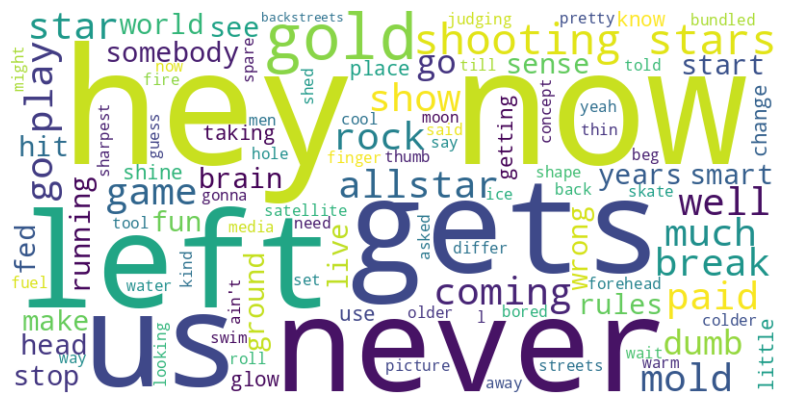

In [85]:
# Generate word cloud for text without stop words
wordcloud = WordCloud(width=800,
                      height=400,
                      background_color="white").generate(text_with_stop)

# Plot the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

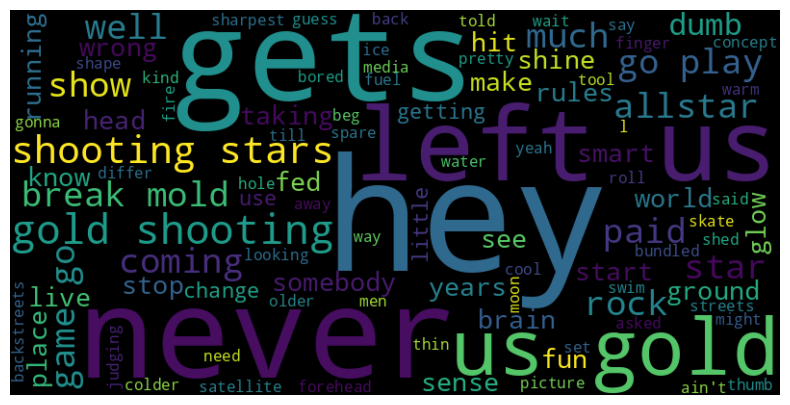

In [86]:
# Generate word cloud for text with stop words
wordcloud = WordCloud(width=800,
                      height=400,
                      background_color="black").generate(text_without_stop)

# Plot the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

# Calculating WERs to evaluate your model

In order to understand how well Whisper or any speech model performs on your taks and dataset, conducting a word error rate analysis may be needed. In this example, we use the `jiwer` python package to test how Whisper performs on the Libri Speech dataset.

This dataset comes with human-generated transcripts (or 'gold transcripts'). For every utterance, we compare the output of Whisper AI with that of the gold transcript, and aggregate the scores over the dataset.

Note: this will take some compute time
[Code Source](https://github.com/openai/whisper/blob/main/notebooks/LibriSpeech.ipynb)


In [20]:
# check your specs
model.device

device(type='cuda', index=0)

In [21]:
! pip install git+https://github.com/openai/whisper.git
! pip install jiwer

  Cloning https://github.com/openai/whisper.git to /tmp/pip-req-build-1iyimza9
  Running command git clone --filter=blob:none --quiet https://github.com/openai/whisper.git /tmp/pip-req-build-1iyimza9
  Resolved https://github.com/openai/whisper.git to commit 517a43ecd132a2089d85f4ebc044728a71d49f6e
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 44.6 MB/s eta 0:00:00


In [22]:
#Setup libraries and check for errors
import os
import numpy as np

try:
    import tensorflow  # required in Colab to avoid protobuf compatibility issues
except ImportError:
    pass

import torch
import pandas as pd
import whisper
import torchaudio

from tqdm.notebook import tqdm


DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

In [23]:
print(DEVICE)

cuda


In [24]:
# A python class to process the dataset, and return the audio data Whisper needs,
# with the gold transcripts per file.
# Note: This only uses the first 30 seconds, for efficiency

class LibriSpeech(torch.utils.data.Dataset):
    """
    A simple class to wrap LibriSpeech and trim/pad the audio to 30 seconds.
    It will drop the last few seconds of a very small portion of the utterances.
    """
    def __init__(self, split="test-clean", device=DEVICE):
        self.dataset = torchaudio.datasets.LIBRISPEECH(
            root=os.path.expanduser("~/.cache"),
            url=split,
            download=True,
        )
        self.device = device

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, item):
        audio, sample_rate, text, _, _, _ = self.dataset[item]
        assert sample_rate == 16000
        audio = whisper.pad_or_trim(audio.flatten()).to(self.device)
        mel_spectrogram = whisper.log_mel_spectrogram(audio)

        return (mel_spectrogram, text)

In [25]:
# Set up the Dataset:
libriSpeech_dataset = LibriSpeech("test-clean")
libriSpeech_dataset_torchDataLoader = torch.utils.data.DataLoader(libriSpeech_dataset, batch_size=16)

100%|██████████| 331M/331M [00:17<00:00, 19.3MB/s]


In [26]:
# Set up language audio model, and print specs
stt_model = whisper.load_model("base.en")
print(
    f"Model is {'multilingual' if stt_model.is_multilingual else 'English-only'} "
    f"and has {sum(np.prod(p.shape) for p in stt_model.parameters()):,} parameters."
)

100%|███████████████████████████████████████| 139M/139M [00:12<00:00, 11.3MiB/s]


Model is English-only and has 71,825,408 parameters.


In [27]:
# predict text without timestamps (for short-form transcription)
whisper_settings = whisper.DecodingOptions(language="en", without_timestamps=True)

In [28]:
# Save transcripts along with the gold transcripts in the dataset
generated_transcripts = []
gold_transcripts = []

for mel_spectograms, whisper_transcripts in tqdm(libriSpeech_dataset_torchDataLoader):
    whisper_results = stt_model.decode(mel_spectograms, whisper_settings)
    generated_transcripts.extend([result.text for result in whisper_results])
    gold_transcripts.extend(whisper_transcripts)

  0%|          | 0/164 [00:00<?, ?it/s]

In [29]:
# Displeay the generated data:
# Adjust pandas display options to show the entire text in a column
pd.set_option('display.max_colwidth', None)

# Save transcripts to a table
data = pd.DataFrame(dict(generated_transcripts=generated_transcripts, gold_transcripts=gold_transcripts))
data

,generated_transcripts,gold_transcripts
0,"He hoped there would be stew for dinner, turnips and carrots and bruised potatoes and fat mutton pieces to be ladled out in thick, peppered flower-faten sauce.",HE HOPED THERE WOULD BE STEW FOR DINNER TURNIPS AND CARROTS AND BRUISED POTATOES AND FAT MUTTON PIECES TO BE LADLED OUT IN THICK PEPPERED FLOUR FATTENED SAUCE
1,"Stuffered into you, his belly counseled him.",STUFF IT INTO YOU HIS BELLY COUNSELLED HIM
2,After early nightfall the yellow lamps would light up here and there the squalid quarter of the brothels.,AFTER EARLY NIGHTFALL THE YELLOW LAMPS WOULD LIGHT UP HERE AND THERE THE SQUALID QUARTER OF THE BROTHELS
3,"Hello Bertie, any good in your mind?",HELLO BERTIE ANY GOOD IN YOUR MIND
4,"Number 10. Fresh Nelly is waiting on you. Good night, husband.",NUMBER TEN FRESH NELLY IS WAITING ON YOU GOOD NIGHT HUSBAND
...,...,...
2615,"Oh, to shoot my soul's full meaning into future years, that they should lend it utterance and salute love that endures from life that disappears.",OH TO SHOOT MY SOUL'S FULL MEANING INTO FUTURE YEARS THAT THEY SHOULD LEND IT UTTERANCE AND SALUTE LOVE THAT ENDURES FROM LIFE THAT DISAPPEARS
2616,"Then I, long tried by natural ills, received the comfort fast. While budding, at thy sight my pilgrim's staff gave out green leaves with morning dues, imperiled.",THEN I LONG TRIED BY NATURAL ILLS RECEIVED THE COMFORT FAST WHILE BUDDING AT THY SIGHT MY PILGRIM'S STAFF GAVE OUT GREEN LEAVES WITH MORNING DEWS IMPEARLED
2617,I love thee freely as men strive for right. I love thee purely as they turn from praise.,I LOVE THEE FREELY AS MEN STRIVE FOR RIGHT I LOVE THEE PURELY AS THEY TURN FROM PRAISE
2618,"I love thee with the passion put to use, in my old grieves, and with my childhoods faith.",I LOVE THEE WITH THE PASSION PUT TO USE IN MY OLD GRIEFS AND WITH MY CHILDHOOD'S FAITH


In [30]:
# Normalize the data (change case, remove special characters, etc)

import jiwer
from whisper.normalizers import EnglishTextNormalizer

normalizer = EnglishTextNormalizer()

In [31]:
data["generated_transcripts_clean"] = [normalizer(text) for text in data["generated_transcripts"]]
data["gold_transcripts_clean"] = [normalizer(text) for text in data["gold_transcripts"]]
data

,generated_transcripts,gold_transcripts,generated_transcripts_clean,gold_transcripts_clean
0,"He hoped there would be stew for dinner, turnips and carrots and bruised potatoes and fat mutton pieces to be ladled out in thick, peppered flower-faten sauce.",HE HOPED THERE WOULD BE STEW FOR DINNER TURNIPS AND CARROTS AND BRUISED POTATOES AND FAT MUTTON PIECES TO BE LADLED OUT IN THICK PEPPERED FLOUR FATTENED SAUCE,he hoped there would be stew for dinner turnips and carrots and bruised potatoes and fat mutton pieces to be ladled out in thick peppered flower faten sauce,he hoped there would be stew for dinner turnips and carrots and bruised potatoes and fat mutton pieces to be ladled out in thick peppered flour fattened sauce
1,"Stuffered into you, his belly counseled him.",STUFF IT INTO YOU HIS BELLY COUNSELLED HIM,stuffered into you his belly counseled him,stuff it into you his belly counseled him
2,After early nightfall the yellow lamps would light up here and there the squalid quarter of the brothels.,AFTER EARLY NIGHTFALL THE YELLOW LAMPS WOULD LIGHT UP HERE AND THERE THE SQUALID QUARTER OF THE BROTHELS,after early nightfall the yellow lamps would light up here and there the squalid quarter of the brothels,after early nightfall the yellow lamps would light up here and there the squalid quarter of the brothels
3,"Hello Bertie, any good in your mind?",HELLO BERTIE ANY GOOD IN YOUR MIND,hello bertie any good in your mind,hello bertie any good in your mind
4,"Number 10. Fresh Nelly is waiting on you. Good night, husband.",NUMBER TEN FRESH NELLY IS WAITING ON YOU GOOD NIGHT HUSBAND,number 10 fresh nelly is waiting on you good night husband,number 10 fresh nelly is waiting on you good night husband
...,...,...,...,...
2615,"Oh, to shoot my soul's full meaning into future years, that they should lend it utterance and salute love that endures from life that disappears.",OH TO SHOOT MY SOUL'S FULL MEANING INTO FUTURE YEARS THAT THEY SHOULD LEND IT UTTERANCE AND SALUTE LOVE THAT ENDURES FROM LIFE THAT DISAPPEARS,0 to shoot my soul is full meaning into future years that they should lend it utterance and salute love that endures from life that disappears,0 to shoot my soul is full meaning into future years that they should lend it utterance and salute love that endures from life that disappears
2616,"Then I, long tried by natural ills, received the comfort fast. While budding, at thy sight my pilgrim's staff gave out green leaves with morning dues, imperiled.",THEN I LONG TRIED BY NATURAL ILLS RECEIVED THE COMFORT FAST WHILE BUDDING AT THY SIGHT MY PILGRIM'S STAFF GAVE OUT GREEN LEAVES WITH MORNING DEWS IMPEARLED,then i long tried by natural ills received the comfort fast while budding at thy sight my pilgrim is staff gave out green leaves with morning dues imperiled,then i long tried by natural ills received the comfort fast while budding at thy sight my pilgrim is staff gave out green leaves with morning dews impearled
2617,I love thee freely as men strive for right. I love thee purely as they turn from praise.,I LOVE THEE FREELY AS MEN STRIVE FOR RIGHT I LOVE THEE PURELY AS THEY TURN FROM PRAISE,i love thee freely as men strive for right i love thee purely as they turn from praise,i love thee freely as men strive for right i love thee purely as they turn from praise
2618,"I love thee with the passion put to use, in my old grieves, and with my childhoods faith.",I LOVE THEE WITH THE PASSION PUT TO USE IN MY OLD GRIEFS AND WITH MY CHILDHOOD'S FAITH,i love thee with the passion put to use in my old grieves and with my childhoods faith,i love thee with the passion put to use in my old griefs and with my childhood is faith


In [32]:
# Calculate the word error rate for the dataset:

wer = jiwer.wer(list(data["gold_transcripts_clean"]), list(data["generated_transcripts_clean"]))
print(f"WER: {wer * 100:.2f} %")

WER: 4.27 %


For Whisper, tested on 2620 audio files, the average errors in transcription are % 4.27. For your project, you can assess if this is something you can live with, or you can decide to choose a different transcription system.

# References and Further Reading

- [Illustrated Wav2vec 2.0](https://jonathanbgn.com/2021/09/30/illustrated-wav2vec-2.html)
- [Wav2vec 2.0: A Framework for Self-Supervised Learning of Speech Representations
](https://arxiv.org/pdf/2006.11477)
- [Robust Speech Recognition via Large-Scale Weak Supervision](https://arxiv.org/pdf/2212.04356)

